In [1]:
import numpy as np
import pandas as pd
import lightgbm as lgb
from pathlib import Path
import plotly.express as px

# 環境設定

In [2]:
DATA_PATH = "../data"
RESULT_PATH = "../results"

# 分析

## 前処理

In [4]:
train = pd.read_parquet(Path(DATA_PATH, "train.parquet"))
test = pd.read_parquet(Path(DATA_PATH, "test.parquet"))

In [5]:
train['group'] = train['id'] // 10000
test['group'] = 66

In [6]:
# 説明変数として用いるカラムの一覧
x_columns = train.columns.drop(['id', 'target']).to_list()

## 学習

In [7]:
models = []
for seed in range(10):
    train_sample = train.sample(frac=0.8, random_state=seed)
    model = lgb.train(
        params={
            'objective': 'regression',
            'learning_rate': 0.05,
            'verbose': 1,
            'metric': "mse"
        },
        num_boost_round=200,
        train_set=lgb.Dataset(data=train_sample[x_columns], label=train_sample['target'])
    )
    models.append(model)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.246306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4234
[LightGBM] [Info] Number of data points in the train set: 528000, number of used features: 696
[LightGBM] [Info] Start training from score 0.000019
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.332706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4234
[LightGBM] [Info] Number of data points in the train set: 528000, number of used features: 696
[LightGBM] [Info] Start training from score -0.000298
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.300420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memor

## 予測

In [8]:
test_y_pred = np.mean([model.predict(test[x_columns]) for model in models], axis=0)

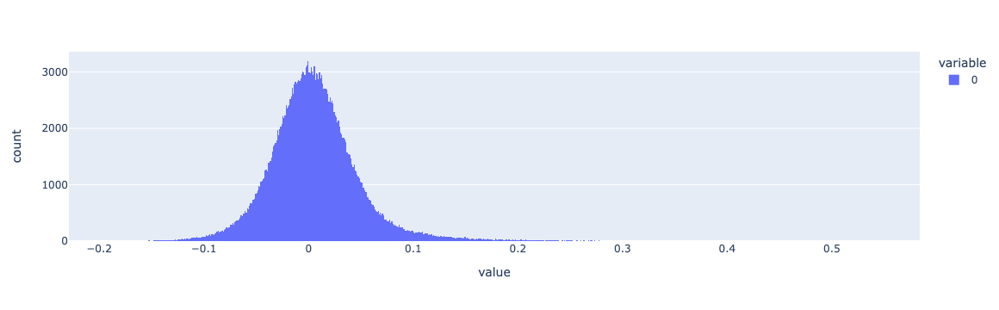

In [9]:
px.histogram(test_y_pred)

## 後処理

In [10]:
test_y_pred[test_y_pred > 0.3] = 3

## 提出用ファイルの作成

In [11]:
pd.DataFrame({'id': test['id'], 'target': test_y_pred}).to_csv(Path(RESULT_PATH, '20230904_submission.csv'), index=False, header=True)